In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../deconvplugin')

import json
import os
import pickle
import torch
import scanpy as sc

PATH = '/home/luca/Documents/data/'

#'/cluster/CBIO/data1/lgortana/'
#'/home/luca/Documents/data/'

/home/luca/anaconda3/envs/plugin-env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load data

In [2]:
# names
adata_name = 'CytAssist_11mm_FFPE_Human_Ovarian_Carcinoma'
sim_tag = "6_moco_clusters_700spots_balanced_15mean_15var"
model_tag = "alpha_0_lr_0.0001_weights_False_divergence_kl_sim_balanced_convnet"

In [3]:
import pandas as pd

data_path = os.path.join(PATH, adata_name)
sim_path = os.path.join(data_path, "sim")

#load image_dict
image_dict = torch.load(os.path.join(sim_path, f'{sim_tag}_image_dict_64.pt'))

#load ground truth
ground_truth = pd.read_csv(os.path.join(sim_path, f'{sim_tag}_gt.csv'), index_col=0)
ground_truth.index = ground_truth.index.astype(str)

In [4]:
#load model infos
model_dir = os.path.join('../models', model_tag)

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [5]:
from deconvplugin.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info,
                        model_state="best",
                        adjusted=False,
                        ground_truth=ground_truth, 
                        image_dict=image_dict
                        )

Loading predicted labels...
Loading true labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


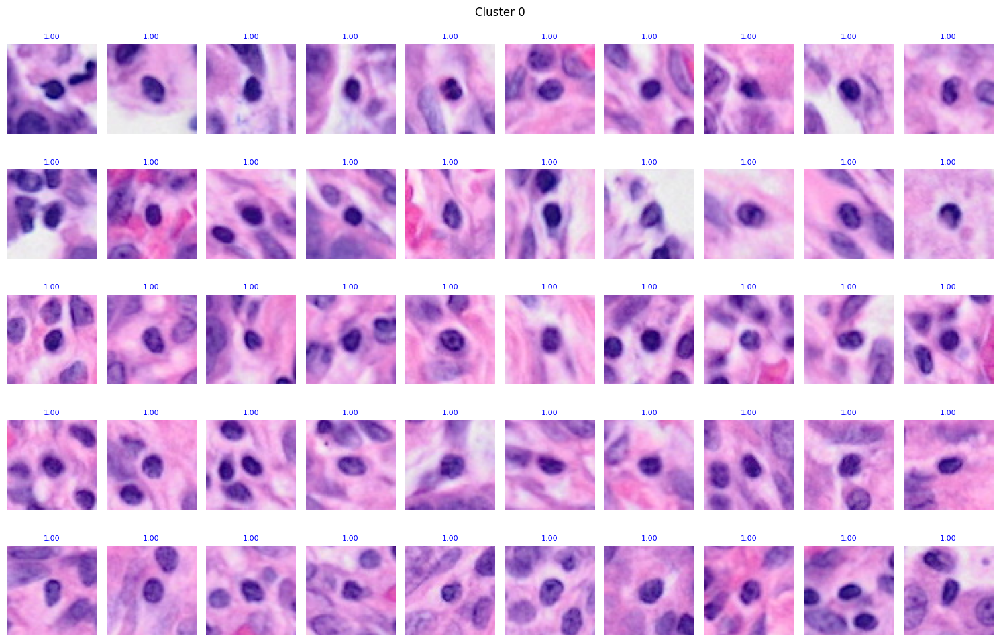

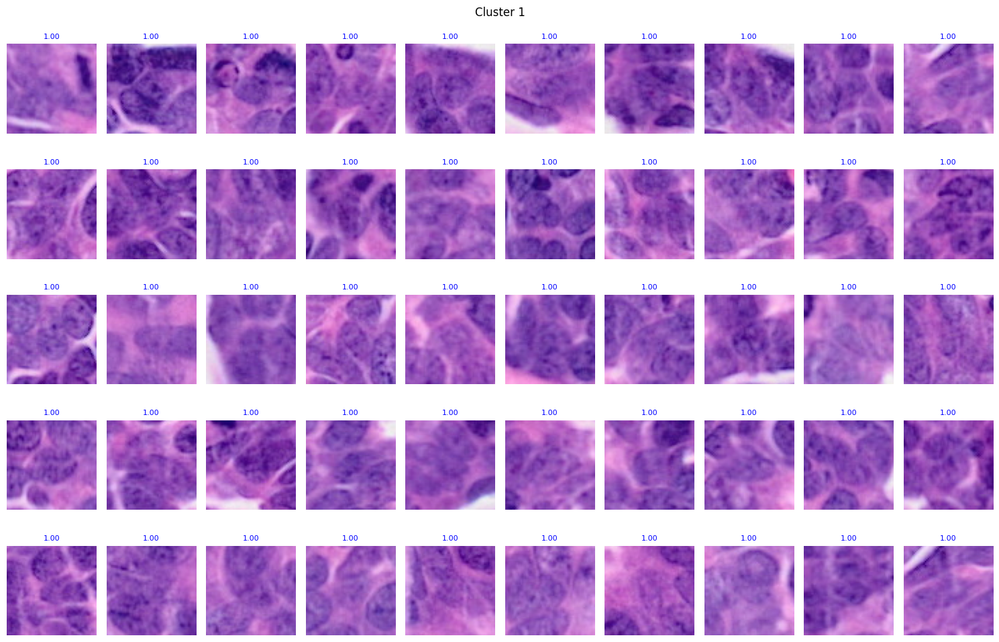

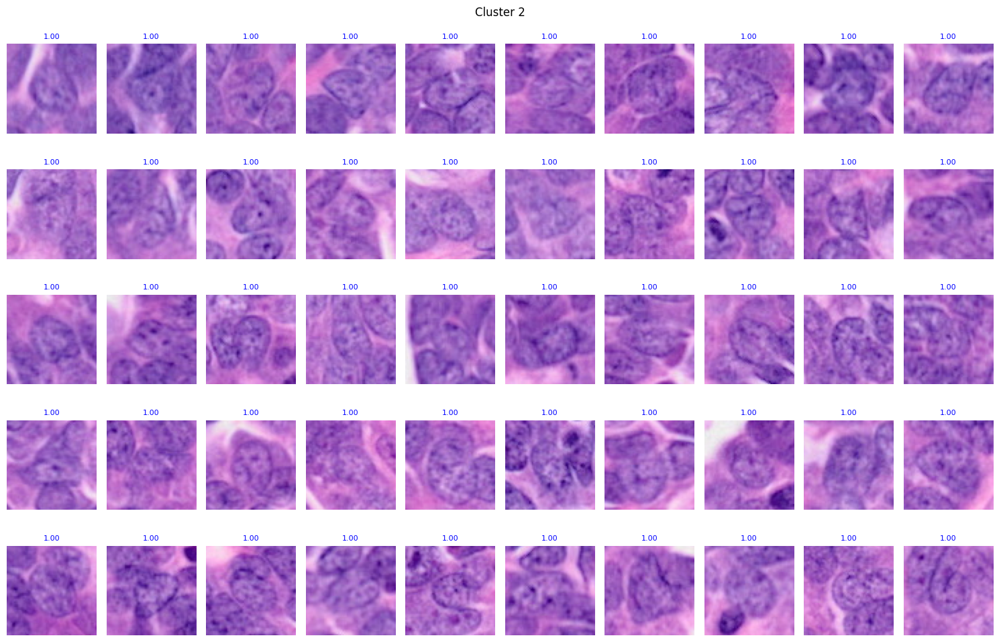

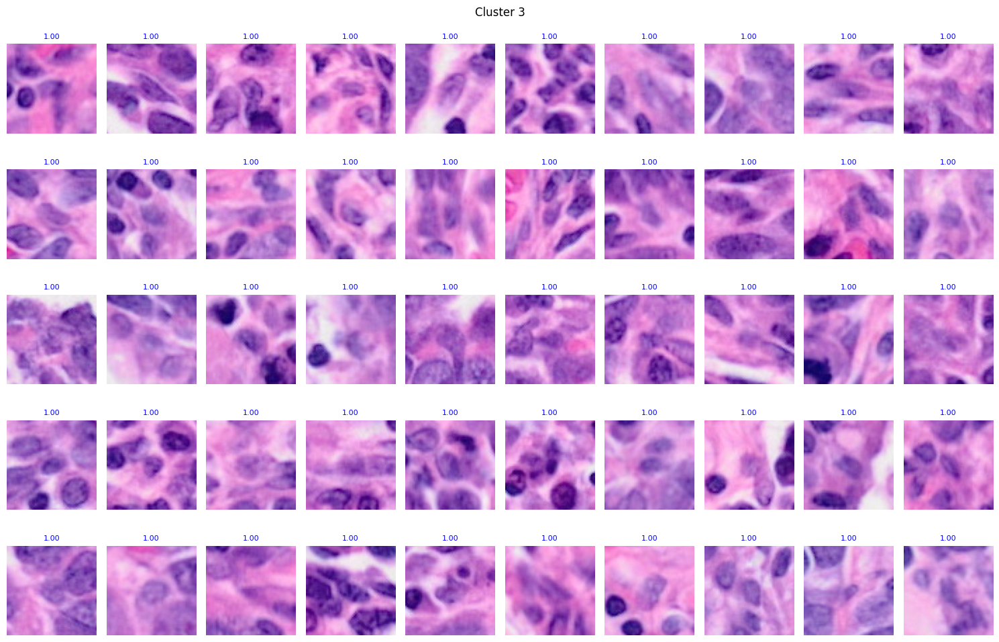

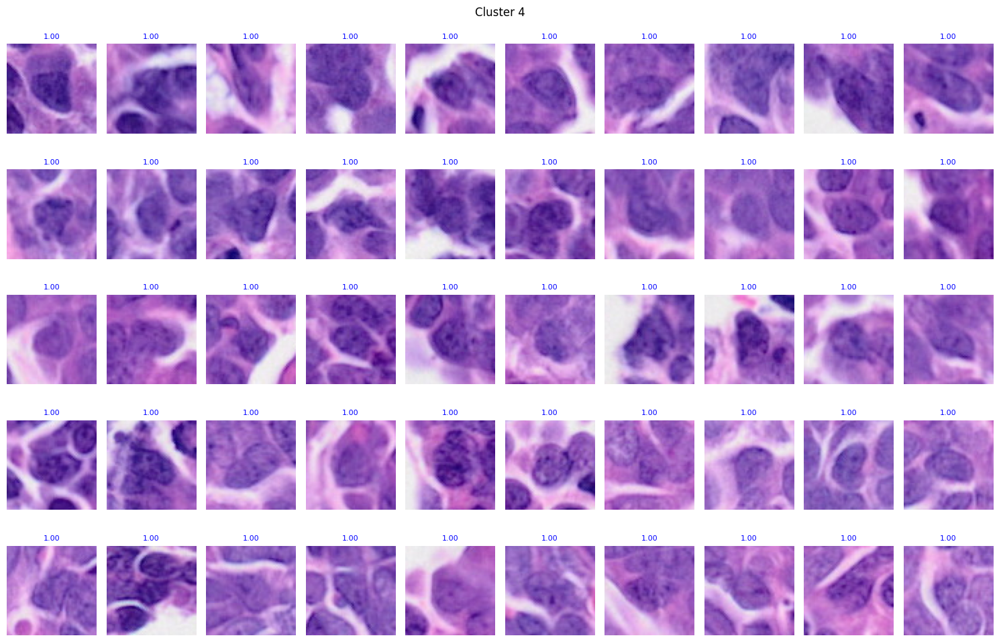

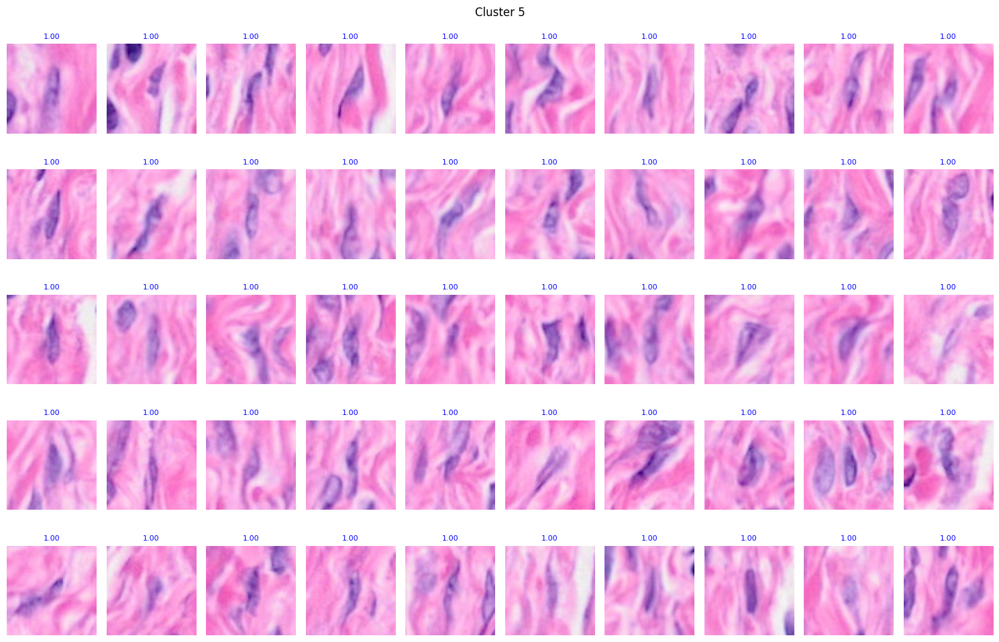

In [6]:
for ct in analyzer.ct_list:
    analyzer.plot_grid_celltype(cell_type=ct, n=50, selection="max", display=True)

Randomly selected spot_id: 620


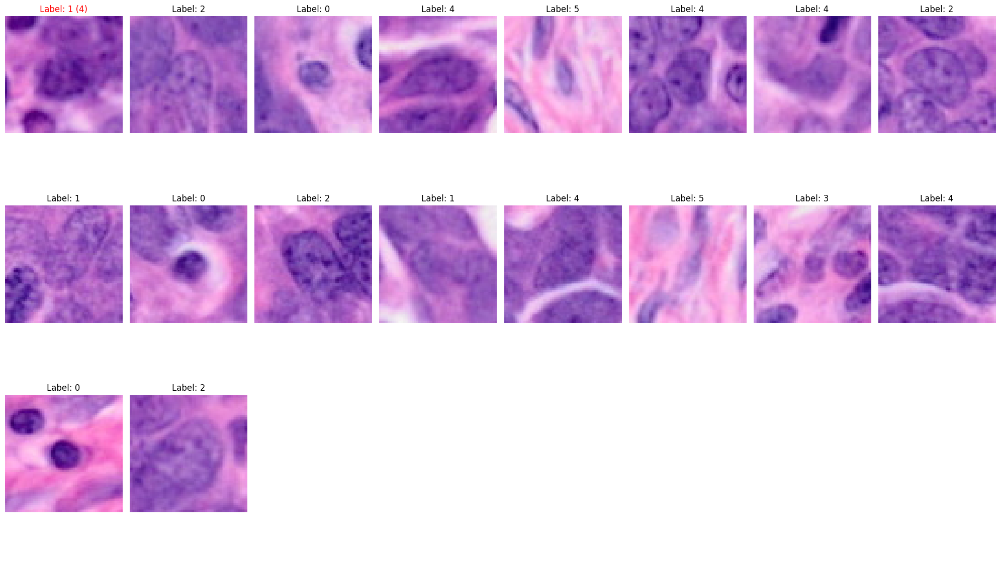

In [12]:
analyzer.plot_mosaic_cells()

In [13]:
analyzer.evaluate_spot_predictions()

{'Spearman Correlation': 0.880315996469143,
 'Pearson Correlation': 0.9280283295215728,
 'Weighted MSE': 0.0002030705876832309,
 'MSE': 0.0012252997670539917,
 'Weighted MAE': 0.003139030557246012,
 'MAE': 0.018925532273548654,
 'R^2 Score': 0.8892034750866792,
 'Balanced Accuracy': 0.7884179745934712,
 'Weighted F1 Score': 0.7773836648951278,
 'Weighted Precision': 0.8009494136519046,
 'Weighted Recall': 0.7757142857142857}

In [14]:
perf = analyzer.evaluate_cell_predictions()
perf

{'Global Accuracy': 0.9176167344106275,
 'Balanced Accuracy': 0.9178416018206982,
 'Weighted F1 Score': 0.9175279064965363,
 'F1 Score (Per Class)': {'Cluster 0': 0.9773539928486293,
  'Cluster 1': 0.8664363845710996,
  'Cluster 2': 0.9245683126325356,
  'Cluster 3': 0.8751907232224596,
  'Cluster 4': 0.9083901571301513,
  'Cluster 5': 0.9543177129384026},
 'Weighted Precision': 0.9181780990621439,
 'Precision (Per Class)': {'Cluster 0': 0.972139893301719,
  'Cluster 1': 0.8403126744835288,
  'Cluster 2': 0.9367710251688153,
  'Cluster 3': 0.9053030303030303,
  'Cluster 4': 0.9140811455847255,
  'Cluster 5': 0.9412790697674419},
 'Weighted Recall': 0.9176167344106275,
 'Recall (Per Class)': {'Cluster 0': 0.9826243259436789,
  'Cluster 1': 0.8942364824717766,
  'Cluster 2': 0.9126794258373205,
  'Cluster 3': 0.8470171293561725,
  'Cluster 4': 0.9027695934001179,
  'Cluster 5': 0.9677226539151226},
 'Confusion Matrix': array([[1640,    0,    0,   16,    1,   12],
        [   0, 1505,   9

In [15]:
pd.DataFrame(perf["Confusion Matrix"], index=analyzer.ct_list, columns=analyzer.ct_list)

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5
Cluster 0,1640,0,0,16,1,12
Cluster 1,0,1505,94,23,61,0
Cluster 2,0,141,1526,0,5,0
Cluster 3,33,60,3,1434,76,87
Cluster 4,2,85,6,70,1532,2
Cluster 5,12,0,0,41,1,1619
